####**Neural network with MLPClassifier**



The MLPClassifier is a type of neural network known as multi-layer perception used for classification tasks. It is a feedforward neural network with a few hidden layers of neurons where each connection has an associated weight. During training, the model adjusts these weights using backpropagation to minimize the loss function. The final layer creates class probabilities, and a threshold is applied to make predictions. This model is effective for complex and non-linear relationships in the data, maybe it will be able to generalize with the complex relationships and be more successful than the previous models.

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(15, 39), max_iter=500, random_state=55)
mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)

Accuracy: 0.8918918918918919
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.97      0.89        35
           1       0.97      0.82      0.89        39

    accuracy                           0.89        74
   macro avg       0.90      0.90      0.89        74
weighted avg       0.90      0.89      0.89        74



Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.


We got a relatively high accuracy of almost 90 percent.
We will see the results in the confusion matrix:

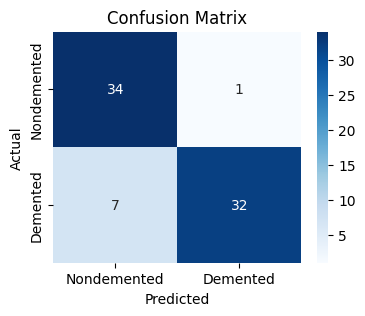

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Nondemented', 'Demented'],
            yticklabels=['Nondemented', 'Demented'])

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

We see 7 observations are FN and 1 observations FP.
A total of 8 errors.

We would like to find out where he failed and why precisely in these observations.
The first thing is to find out which observations were misclassified.

In [ ]:
misclassified_mlp_df = pd.DataFrame({
    'index': X_test.index,
    'True_Label': y_test,
    'Predicted_Label': y_pred
})

# Filter out the misclassified instances
misclassified_mlp_df = misclassified_mlp_df[misclassified_mlp_df['True_Label'] != misclassified_mlp_df['Predicted_Label']]
misclassified_mlp_df.reset_index(drop=True, inplace=True)
print("Misclassified Instances:")
misclassified_mlp_df

Misclassified Instances:


,index,True_Label,Predicted_Label
0,274,1,0
1,234,1,0
2,289,1,0
3,265,1,0
4,3,1,0
5,200,1,0
6,106,0,1
7,273,1,0


We received 8 observations.

We would like to get the values of the features after normalization (those on which the training was actually done): `misclassified_mlp_df`.





In [ ]:
misclassified_mlp_df = pd.merge(pca_df, misclassified_mlp_df, left_index=True, right_on='index')
misclassified_mlp_df.drop(['Group'], axis=1, inplace=True)
misclassified_mlp_df

,PC1,PC2,PC3,PC4,PC5,index,True_Label,Predicted_Label
4,-1.949968,0.762671,-0.841918,-0.590963,0.031303,3,1,0
6,-1.118014,-0.645634,0.558020,0.045272,-1.364541,106,0,1
5,1.084822,0.453407,-2.395289,-0.178680,-1.084176,200,1,0
1,1.527861,-0.002116,-0.720595,-0.488738,0.577976,234,1,0
3,1.797851,-0.907698,-0.876870,0.108996,0.094573,265,1,0
7,-1.899248,-0.751308,-0.695464,0.253293,-0.405617,273,1,0
0,-1.862345,-0.999191,-0.563867,-0.227636,-0.626596,274,1,0
2,-2.375759,-0.757806,-0.095428,-0.328320,-0.339181,289,1,0


We will use LIME (Local Explanations for Model-Agnostic Interpretation) to provide local interpretations of predictions made by the model about misclassified instances.

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

X_features = pca_df.drop(columns=['Group'])
feature_names = X_features.columns

explainer = LimeTabularExplainer(X_features.values, mode="classification", feature_names=feature_names, training_labels=pca_df['Group'])
for i in misclassified_mlp_df["index"].values:
  print(f"for the instance {i}")
  instance_index = i
  instance_features = X_features.iloc[instance_index].values
  explanation = explainer.explain_instance(instance_features, mlp.predict_proba)
  explanation.show_in_notebook()

for the instance 3


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 106


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 200


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 234


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 265


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 273


X does not have valid feature names, but MLPClassifier was fitted with feature names


X does not have valid feature names, but MLPClassifier was fitted with feature names


for the instance 274


for the instance 289


X does not have valid feature names, but MLPClassifier was fitted with feature names


PC4 and PC5 contribute a significant part to the misclassification of 5 out of 8 errors. They are the components that contribute the most to the wrong results.
The next components that contribute to the most incorrect results after them are PC2 and PC1 which in 54 cases out of 8 was one of the causes of the misclassification.

It could be that the problem is with these components that are not related and depend on the class, but the model insists on seeing a connection between the attribute and the classification class, and therefore we get wrong classifications. But it could also be that the problem is with these specific observations that do not represent the majority but are just noise.

We will try to omit the components and see if there is any improvement in the results of the model. If there is an improvement, we will know that the problem is in the model. Otherwise we will understand that the problem is in the specific data.

When we downloaded the PC4 component we got that the maximum accuracy is 77 percent.
But when we dropped the PC5 component we got that the maximum accuracy is 90 percent which is more than the original maximum accuracy!.
Wow! So it turns out that PC5 "interfered" with the results. and caused misclassifications without contributing anything significant.

In [ ]:
X_train_xg = X_train.drop(columns=['PC5'])
X_test_xg = X_test.drop(columns=['PC5'])

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(27, 39), max_iter=500, random_state=55)
mlp.fit(X_train_xg, y_train)

y_pred = mlp.predict(X_test_xg)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("Classification Report:")
print(report)

Accuracy: 0.9054054054054054
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.94      0.90        35
           1       0.94      0.87      0.91        39

    accuracy                           0.91        74
   macro avg       0.91      0.91      0.91        74
weighted avg       0.91      0.91      0.91        74



Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.


We got a slightly higher accuracy. Let's see how the matrix has changed.

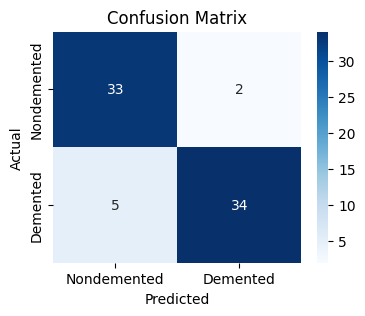

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Nondemented', 'Demented'],
            yticklabels=['Nondemented', 'Demented'])

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

We see 5 observations are FN and 2 observations FP. A total of 7 errors. Let's take a closer look at the misclassified observations.

In [ ]:
misclassified_mlp_df = pd.DataFrame({
    'index': X_test_xg.index,
    'True_Label': y_test,
    'Predicted_Label': y_pred
})

# Filter out the misclassified instances
misclassified_mlp_df = misclassified_mlp_df[misclassified_mlp_df['True_Label'] != misclassified_mlp_df['Predicted_Label']]
misclassified_mlp_df.reset_index(drop=True, inplace=True)
print("Misclassified Instances:")
misclassified_mlp_df

Misclassified Instances:


,index,True_Label,Predicted_Label
0,132,1,0
1,274,1,0
2,289,1,0
3,3,1,0
4,255,1,0
5,139,0,1
6,260,0,1


We note that there are 3 observations in the 2 different runs (the original, and after downloading PC5) that are misclassified and are therefore likely to be noise.

Is there overfitting?

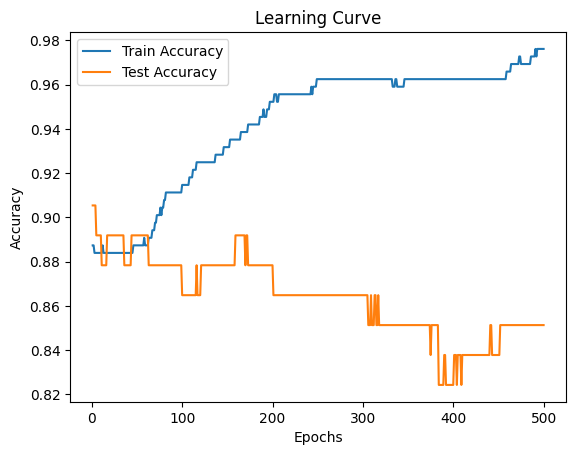

In [ ]:
train_accuracy = []
test_accuracy = []

for epoch in range(1, 501):
    mlp.partial_fit(X_train_xg, y_train, classes=np.unique(y_train))
    y_train_pred = mlp.predict(X_train_xg)
    y_test_pred = mlp.predict(X_test_xg)
    train_accuracy.append(accuracy_score(y_train, y_train_pred))
    test_accuracy.append(accuracy_score(y_test, y_test_pred))

plt.plot(range(1, 501), train_accuracy, label='Train Accuracy')
plt.plot(range(1, 501), test_accuracy, label='Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

It seems that after 60 or so epochs, the accuracy does not increase, but on the other hand, the accuracy of the training data does increase, so the overfitting is getting bigger and bigger.

####**Neural network with tensorflow**


Neural networks, also known as artificial neural networks (ANNs), are a class of machine learning models inspired by the structure and functioning of the human brain. They have proven to be incredibly powerful tools for solving a wide range of complex tasks, including pattern recognition, image and speech recognition, natural language processing, and more.

We will use a front feed grid. where each layer feeds the next layer.
At the beginning random values are set as the weights but they go through a learning process until they adjust themselves to the ideal weights.

We define the neural network model

In [ ]:
model = Sequential()
model.add(Dense(5, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(16, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(2, activation='softmax'))

In [ ]:
model.compile(optimizer="Adam", loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history = model.fit(X_train, y_train, epochs=150, validation_data=(X_test, y_test), shuffle = True)

Epoch 1/150
10/10 [==============================] - 0s 13ms/step - loss: 0.2984 - accuracy: 0.8635 - val_loss: 0.4806 - val_accuracy: 0.8108
Epoch 2/150
10/10 [==============================] - 0s 6ms/step - loss: 0.2979 - accuracy: 0.8703 - val_loss: 0.4895 - val_accuracy: 0.7973
Epoch 3/150
10/10 [==============================] - 0s 6ms/step - loss: 0.2970 - accuracy: 0.8737 - val_loss: 0.4835 - val_accuracy: 0.7973
Epoch 4/150
10/10 [==============================] - 0s 6ms/step - loss: 0.2969 - accuracy: 0.8737 - val_loss: 0.4799 - val_accuracy: 0.7838
Epoch 5/150
10/10 [==============================] - 0s 6ms/step - loss: 0.2974 - accuracy: 0.8669 - val_loss: 0.4884 - val_accuracy: 0.7838
Epoch 6/150
10/10 [==============================] - 0s 8ms/step - loss: 0.2984 - accuracy: 0.8737 - val_loss: 0.4970 - val_accuracy: 0.8108
Epoch 7/150
10/10 [==============================] - 0s 7ms/step - loss: 0.2982 - accuracy: 0.8669 - val_loss: 0.4959 - val_accuracy: 0.7973
Epoch 8/150


Evaluate the model on the test set

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 85.14%


We will examine whether we have over-fitting.
One of the signs of overfitting is that the training accuracy improves while the validation accuracy starts to decrease.
We will examine this in the visualization of Plot training and validation accuracy over the epochs.

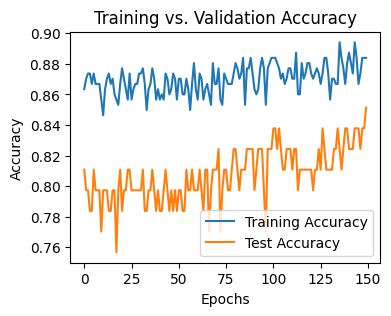

In [ ]:
plt.figure(figsize=(4,3))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs. Validation Accuracy')
plt.show()

It can be seen in the simulation that there is an overfitting (of about 6 percent) and it decreases with the increasing number of EPOCHs.

We tried to combine early stopping with regularization techniques in neural networks. To reduce this problematic overfitting, but we did not get good results.
And so we will try to understand the results of this model.

**Visualizing the training progress and model performance can provide valuable insights into how well our neural network is learning from the data.**

#####Training and Validation Loss and Accuracy Over Epochs:


In [ ]:
fig = make_subplots(rows=1, cols=2, subplot_titles=('Loss', 'Accuracy'))

# Add loss traces
fig.add_trace(go.Scatter(x=list(range(1, len(history.history['loss'])+1)), y=history.history['loss'], mode='lines', name='Training Loss'), row=1, col=1)
fig.add_trace(go.Scatter(x=list(range(1, len(history.history['val_loss'])+1)), y=history.history['val_loss'], mode='lines', name='Validation Loss'), row=1, col=1)

# Add accuracy traces
fig.add_trace(go.Scatter(x=list(range(1, len(history.history['accuracy'])+1)), y=history.history['accuracy'], mode='lines', name='Training Accuracy'), row=1, col=2)
fig.add_trace(go.Scatter(x=list(range(1, len(history.history['val_accuracy'])+1)), y=history.history['val_accuracy'], mode='lines', name='Validation Accuracy'), row=1, col=2)

fig.update_layout(title='Training History')
fig.show()

**Loss**:

The visual analysis reveals that in the training data it starts from a loss of 0.3 but decreases steadily as the EPOCHs progress. On the other hand, in the test data, the drop is really not constant.. there are storms and waves. But from a global perspective, we see that there is a decline.

**Accuracy**:

The training data and the test data do not converge to one exact buffer. They are quite unstable but yes you can say that the training data is hovering around 0.88 right from the start. In contrast, the test data starts at 0.8, they have many ups and downs, but slowly an upward trend is visible. And in the end the accuracy reaches 0.85. Although it seems a very large overfitting. We will notice that the graph focuses only between 0.75 and 0.9, so it seems like a very large distance between the 2 m precisions, while in fact it is only 4 percent.

#####ROC Curve and AUC

3/3 [==============================] - 0s 6ms/step


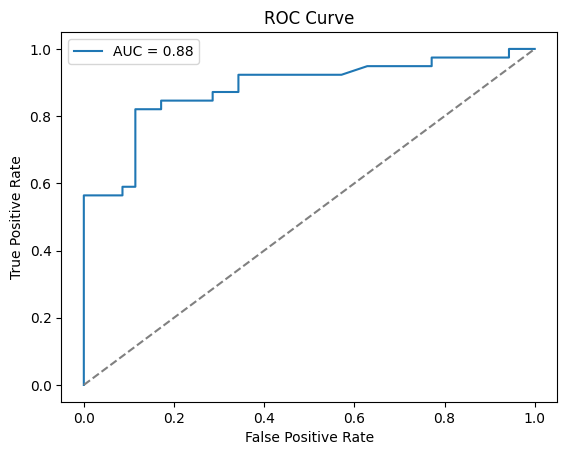

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

y_pred = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred[:, 1])

auc = roc_auc_score(y_test, y_pred[:, 1])

plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

Our ROC curve appears as "steps" instead of a smooth and continuous curve because we have a limited number of distinct threshold values for the model's prediction.
We have a number of attributes that are not continuous but have a small number of discrete and limited values. For example, its M/F feature has only 2 possibilities Male and female.

Our ROC curve is far from the diagonal line, which shows that the discriminative power of the model is very good.
Our AUC value is 0.88 and it indicates good diagnosis and performance of the model.

#####Confusion matrix

3/3 [==============================] - 0s 6ms/step


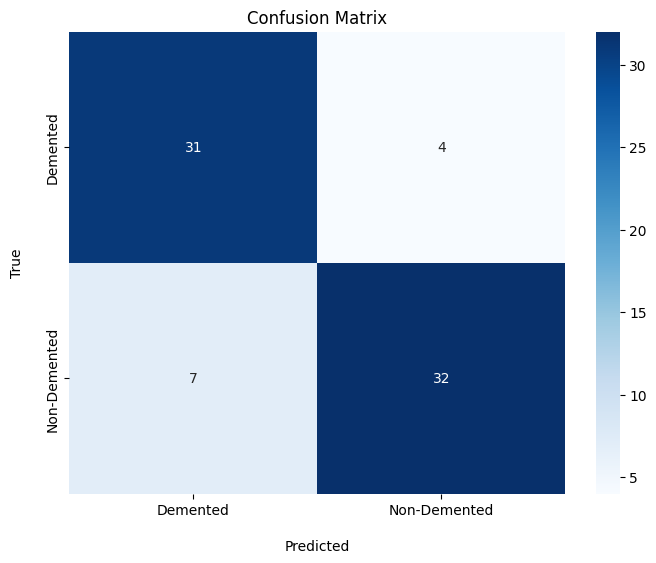

In [ ]:
department_names = ['Non-Demented', 'Demented']

y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)

cm = confusion_matrix(y_test, y_pred_labels)
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=department_names, yticklabels=department_names)
plt.xlabel('\nPredicted')
plt.ylabel('True\n')
plt.title('Confusion Matrix')
plt.show()

The high values in the main diagonal in cells TP TN in relation to the other values show the high accuracy we saw earlier in AUC.

We see 7 observations are FN and 4 observations FP. A total of 11 errors.

We would like to find out where he failed. The first thing is to find out which observations were misclassified.


In [ ]:
misclassified_tf_df = pd.DataFrame({
    'index': X_test.index,
    'True_Label': y_test,
    'Predicted_Label': y_pred_labels
})

misclassified_tf_df = misclassified_tf_df[misclassified_tf_df['True_Label'] != misclassified_tf_df['Predicted_Label']]
misclassified_tf_df.reset_index(drop=True, inplace=True)
misclassified_tf_df = pd.merge(best_features_df, misclassified_tf_df, left_index=True, right_on='index')
misclassified_tf_df.drop(['Group'], axis=1, inplace=True)
print("Misclassified Instances:")
misclassified_tf_df

Misclassified Instances:


,M/F,MMSE,SES,EDUC,eTIV,index,True_Label,Predicted_Label
5,-0.855063,-0.154114,0.525263,1.201219,-1.652092,6,0,1
0,-0.855063,-0.456574,2.352479,-2.415248,-0.172516,132,1,0
8,1.169505,0.148345,1.438871,-0.968661,-0.258205,139,0,1
6,1.169505,0.753265,-1.301954,1.201219,1.598405,192,0,1
4,1.169505,0.148345,1.438871,-0.968661,-0.441010,200,1,0
3,1.169505,0.148345,1.438871,-1.330308,1.489865,223,0,1
7,1.169505,0.450805,-1.301954,1.201219,0.884324,255,1,0
10,1.169505,0.148345,-0.388346,1.201219,0.970014,273,1,0
1,1.169505,0.753265,-0.388346,1.201219,0.924313,274,1,0
2,1.169505,0.753265,-1.301954,0.477926,1.227083,289,1,0


We will use the SHAP library to check what the most important features are in this model. The attributes responsible for this performance. We got in the following plot that PC2 is in the first place followed by PC4.

We have already seen these components that are at the top of the influencing components during the analysis of the results of the other algorithms.

10/10 [==============================] - 0s 3ms/step


  0%|          | 0/74 [00:00<?, ?it/s]

275/275 [==============================] - 0s 2ms/step


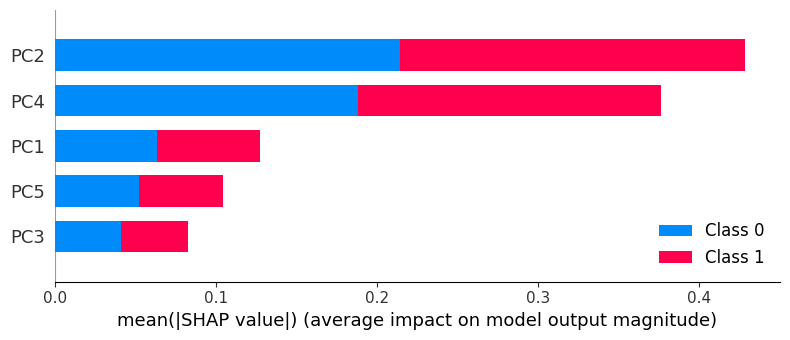

In [ ]:
explainer = shap.KernelExplainer(model.predict, X_train, verbose=0)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test);

####**Summary**

The **Regression** model gave us an accuracy of 77.82 percent. We saw that there was no serious overfitting, so it is likely that the problem is the model not fitting the data or the data itself. A logistic regression model assumes a linear relationship between the attributes and the logistic odds of the target variable. If the true relationship is not linear, logistic regression may struggle to capture it. We hypothesize that this model is too simple for our data, so we will use more complex models.

The **XGBoost Classifier** model gives us an accuracy of 82.43 percent. We saw that there is a very large overfitting. We tried to solve it in several ways but were unsuccessful. The model learns the training data too well. Still the results are better than regression apparently there is indeed no linear relationship between the features and the target variable.

The **Random Forest Classifier** model gave us an accuracy of 85.13 percent. We have seen that this model gives a lot of weight to the features that have a large part in the misclassifications. Apparently the model studies the data in an inaccurate way or maybe the problem is with the data that are unusual and therefore classified incorrectly.

The **Neural network with MLPClassifier** model gives us an accuracy of 90.54 percent. At first it gave an accuracy of 89 percent. But from a review of the misclassified observations we saw that one of the components contributed a lot to it. Therefore we assumed that this specific component probably had a problem and so we tried to omit it and then we got almost 91 percent better results. This model is more successful than the previous models because neural networks are able to deal with complex and non-linear relationships in the data more than regression or Random Forest or XGBoost. They can capture complex patterns that may be challenging for tree-based models like Random Forest or XGBoost and regression.

The **Neural network with tensorflow** model gives us an accuracy of 85 percent. with slight overfitting. MLPClassifier gives better results, maybe scikit-learn's MLPClassifier uses a different optimization algorithm.

Some observations were misclassified by all algorithms. This gives us a red light that it's probably noises.

7 more observations were misclassified in at least 2 of the models and they are (index: 274, 289, 255, 139, 260, 273, 132)
